In [1]:
#import necessary libraries
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import xarray as xr
import scipy

import regionmask

# import regionmask

from scipy import stats
from scipy.stats import pearsonr, linregress

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd

import time
from datetime import datetime, date

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.ticker import MaxNLocator, FuncFormatter
import matplotlib.dates as mdates

import shapefile
from mpl_toolkits.axes_grid1 import make_axes_locatable
import warnings
import os

import sys
import os.path
import subprocess
import math
import csv

from netCDF4 import Dataset

#import s3fs
import copy
import json, copy
from pandas import DataFrame
from osgeo import gdal, ogr, osr

In [2]:
# non_secular_aligned_TWS_fields.nc

In [3]:
# secular_aligned_TWS_fields.nc

In [7]:
secular_aligned_final = xr.open_dataset(r'secular_aligned_TWS_fields.nc')
secular_aligned_final

<xarray.Dataset> Size: 550MB
Dimensions:  (lon: 720, lat: 360, time: 265)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 2kB 2002-04-01 2002-05-01 ... 2024-04-01
Data variables:
    tws      (time, lat, lon) float64 550MB ...

In [8]:
secular_aligned_final = secular_aligned_final.assign_coords(time=non_secular_aligned_final1['time'].values)
secular_aligned_final

<xarray.Dataset> Size: 550MB
Dimensions:  (lon: 720, lat: 360, time: 265)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2024-04-30
Data variables:
    tws      (time, lat, lon) float64 550MB ...

In [ ]:
secular_aligned_final.to_netcdf(r'CSR_Secular_TWS_field.nc') #runs, becasue it is already saved nc file, so comes error again

--------

In [9]:
non_secular_aligned_final1 = xr.open_dataset(r'non_secular_aligned_TWS_fields.nc')
non_secular_aligned_final1

<xarray.Dataset> Size: 275MB
Dimensions:  (lon: 720, lat: 360, time: 265)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2024-04-30
Data variables:
    tws      (time, lat, lon) float32 275MB ...

-------

In [ ]:
# total_TWS_CSR = Total_TWS_fields_improved_solid_earth_correction_Dai_proposal.nc

In [10]:
csr_secular = xr.open_dataset(r'CSR_Secular_TWS_field.nc')
csr_secular

<xarray.Dataset> Size: 550MB
Dimensions:  (lon: 720, lat: 360, time: 265)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 2kB 2002-04-01 2002-05-01 ... 2024-04-01
Data variables:
    tws      (time, lat, lon) float64 550MB ...

In [11]:
csr_secular_slice = csr_secular.sel(time=slice('2002-04', '2016-03'))
csr_secular_slice

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-01 2002-05-01 ... 2016-03-01
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [12]:
csr_non_secular = xr.open_dataset(r'non_secular_aligned_TWS_fields.nc')
csr_non_secular

<xarray.Dataset> Size: 275MB
Dimensions:  (lon: 720, lat: 360, time: 265)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2024-04-30
Data variables:
    tws      (time, lat, lon) float32 275MB ...

In [13]:
csr_non_secular_slice = csr_non_secular.sel(time=slice('2002-04', '2016-03'))
csr_non_secular_slice 

<xarray.Dataset> Size: 174MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float32 174MB ...

In [14]:
total_TWS_CSR = xr.open_dataset(r'Total_TWS_fields_improved_solid_earth_correction_Dai_proposal.nc') #Total_TWS_fields_improved_solid_earth_correction_Dai_proposal.nc
total_TWS_CSR

<xarray.Dataset> Size: 550MB
Dimensions:  (lon: 720, lat: 360, time: 265)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 2kB 2002-04-30 2002-05-31 ... 2024-04-30
Data variables:
    tws      (time, lat, lon) float64 550MB ...

In [15]:
total_CSR_slice = total_TWS_CSR.sel(time=slice('2002-04', '2016-03'))
total_CSR_slice

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

------

## CSR Total TWS, Secular TWS and Non-secular TWS

In [16]:
csr_secular_slice

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-01 2002-05-01 ... 2016-03-01
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [17]:
csr_non_secular_slice 

<xarray.Dataset> Size: 174MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float32 174MB ...

In [18]:
total_CSR_slice

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

---------

In [19]:
total_JPL_slice = xr.open_dataset(r'Total_TWS_fields_solid_earth_corrected_JPL_solutions.nc') #Total_TWS_fields_solid_earth_corrected_JPL_solutions.nc
total_JPL_slice

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [20]:
JPL_secular_slice = xr.open_dataset(r'Secular_TWS_field_ready2use_JPL.nc')
JPL_secular_slice

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [21]:
JPL_non_secular_slice = xr.open_dataset(r'NonSecular_TWS_field_ready2use_JPL.nc')
JPL_non_secular_slice

<xarray.Dataset> Size: 174MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float32 174MB ...

-------

In [22]:
total_ITSG_slice = xr.open_dataset(r'Total_TWS_fields_solid_earth_corrected_ITSG_solutions.nc')
total_ITSG_slice

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [23]:
ITSG_secular_slice = xr.open_dataset(r'Secular_TWS_field_ready2use_ITSG.nc')
ITSG_secular_slice

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [24]:
ITSG_non_secular_slice = xr.open_dataset(r'NonSecular_TWS_field_ready2use_ITSG.nc')
ITSG_non_secular_slice

<xarray.Dataset> Size: 174MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float32 174MB ...

-------

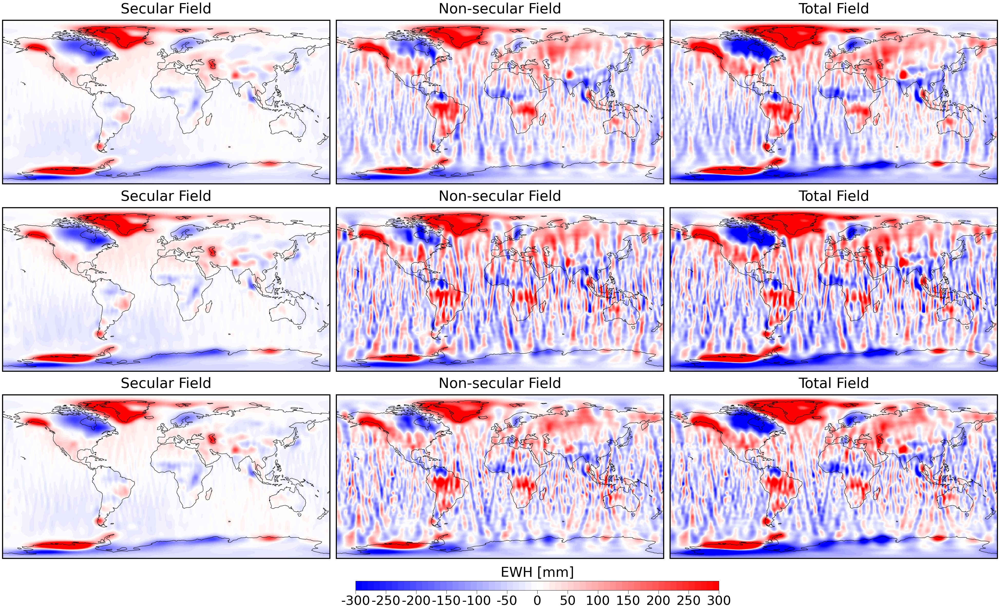

In [25]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.ticker import FuncFormatter
import matplotlib.colors as colors
import matplotlib.ticker as mticker

# Correct and monotonic irregular levels
levels = [
     -300, -290, -280, -270, -260,
    -250, -240, -230, -220, -210, -200, -190, -180, -170, -160, -150, -140, -130, -120,
    -110, -100, -90, -80, -70, -60, -50, -40, -30, -20, -10, 0,
    10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
    160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270,
    280, 290, 300
]

# Create BoundaryNorm
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256, clip=True)

datasets = [
    (ITSG_secular_slice, 'Secular Field'),
    (ITSG_non_secular_slice, 'Non-secular Field'),
    (total_ITSG_slice, 'Total Field'),
    
    (JPL_secular_slice, 'Secular Field'),
    (JPL_non_secular_slice, 'Non-secular Field'),
    (total_JPL_slice, 'Total Field'),
    
    (csr_secular_slice, 'Secular Field'),
    (csr_non_secular_slice, 'Non-secular Field'),
    (total_CSR_slice, 'Total Field'),
]

fig, axes_2d = plt.subplots(nrows=3, ncols=3, figsize=(50, 40), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes_2d.flatten()

for ax, (ds, title) in zip(axes, datasets):
    da = ds['tws'].sel(time="2002-04-16", method='nearest')
    im = da.plot.imshow(
        ax=ax,
        cmap="bwr",
        norm=norm,
        vmin=levels[0],
        vmax=levels[-1],
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        rasterized=True
    )
    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')
        
    
    ax.coastlines()
    # Set dataset name as the subplot title
    ax.set_title(title, fontsize=40, fontweight='normal', pad=20)


    # ax.text(
    # 0.12, 0.5, title,
    # transform=ax.transAxes,
    # fontsize=30,
    # fontweight='bold',
    # ha='center',
    # va='top',
    # bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3'))

# Define major ticks every 50 units
major_ticks = [v for v in levels if v % 50 == 0]

# Get horizontal extent spanning the first and last column subplots in bottom row
bottom_row = axes_2d[-1, :]
left = (bottom_row[0].get_position().x0) + 0.275
right = (bottom_row[1].get_position().x1) 
width = (right - left)*1.25

# Position the colorbar just below the bottom row, with some vertical padding
bottom = min(ax.get_position().y0 for ax in bottom_row) + 0.05
height = 0.009  # colorbar thickness

# Create an axes for the colorbar at calculated position
cbar_ax = fig.add_axes([left, bottom, width, height])

cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', boundaries=levels, norm=norm, ticks=major_ticks)
cbar.ax.set_xlabel("EWH [mm]", fontsize=38, weight='normal', labelpad=12)
cbar.ax.tick_params(labelsize=36, length=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}"))

cbar.minorticks_off()

plt.subplots_adjust(wspace=0.02, hspace=-0.55)
#plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/Illustration_of_GF_without_SE_correction.png', dpi=300, bbox_inches='tight')
plt.show()

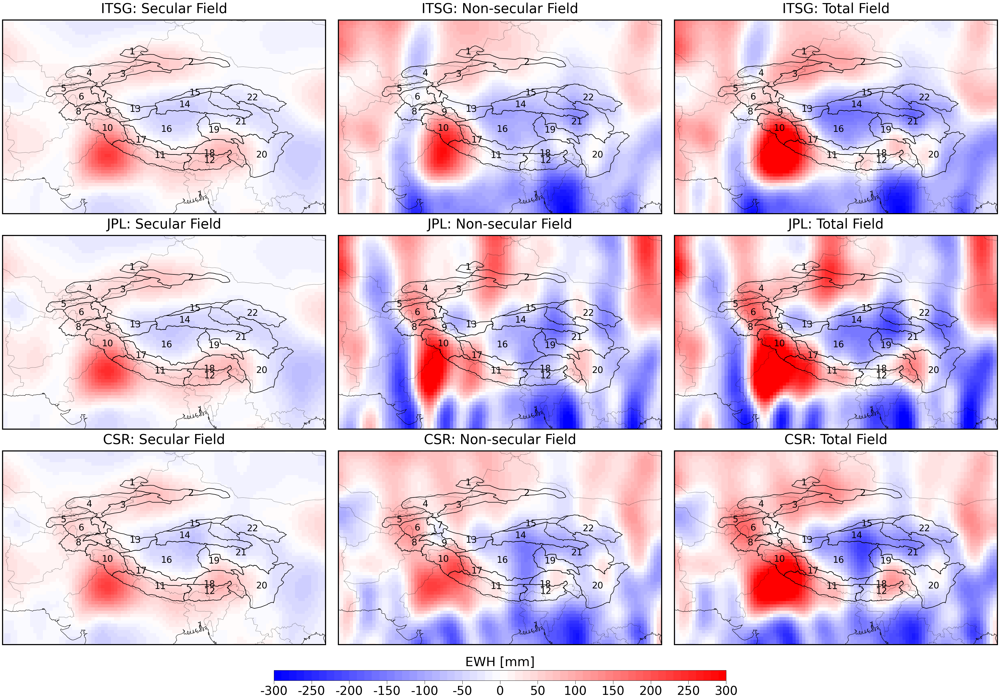

In [42]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.colors as colors
from matplotlib.ticker import FuncFormatter

# Read HMA boundary shapefile and project to WGS84
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# Region of interest (HMA)
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

levels = [
    -300, -290, -280, -270, -260,
    -250, -240, -230, -220, -210, -200, -190, -180, -170, -160, -150, -140, -130, -120,
    -110, -100, -90, -80, -70, -60, -50, -40, -30, -20, -10, 0,
    10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
    160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270,
    280, 290, 300
]
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256, clip=True)

datasets = [
    (ITSG_secular_slice, 'ITSG: Secular Field'),
    (ITSG_non_secular_slice, 'ITSG: Non-secular Field'),
    (total_ITSG_slice, 'ITSG: Total Field'),
    
    (JPL_secular_slice, 'JPL: Secular Field'),
    (JPL_non_secular_slice, 'JPL: Non-secular Field'),
    (total_JPL_slice, 'JPL: Total Field'),
    
    (csr_secular_slice, 'CSR: Secular Field'),
    (csr_non_secular_slice, 'CSR: Non-secular Field'),
    (total_CSR_slice, 'CSR: Total Field'),
]

fig, axes_2d = plt.subplots(
    nrows=3, ncols=3, figsize=(50, 40),
    subplot_kw={'projection': ccrs.PlateCarree()},
    gridspec_kw={'wspace': 0.04, 'hspace': -0.4}
)
axes = axes_2d.flatten()

for ax, (ds, title) in zip(axes, datasets):
    da = ds['tws'].sel(time="2002-04-16", method='nearest')
    da_cropped = da.sel(lat=slice(lat_max, lat_min), lon=slice(lon_min, lon_max))

    im = da_cropped.plot.imshow(
        ax=ax,
        cmap="bwr",
        norm=norm,
        vmin=levels[0],
        vmax=levels[-1],
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        rasterized=True
    )

    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')

    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.set_title(title, fontsize=38, fontweight='normal', pad=20)

    # Add HMA shapefile boundary to each subplot
    for geom in hma_boundary.geometry:
        ax.add_geometries([geom], crs=ccrs.PlateCarree(),
                          edgecolor='black', facecolor='none', linewidth=1.5)
    for idx, row in hma_boundary.iterrows():
            x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
            region_num = row['Region_No']  # Replace with your region number column name
            ax.text(x, y, str(region_num), fontsize=25, ha='center', va='center', transform=ccrs.PlateCarree())

# Define major ticks every 50 units
major_ticks = [v for v in levels if v % 50 == 0]

# Place the colorbar below (3,2) subplot at index [2,1]
target_ax = axes_2d[2, 1]
pos = target_ax.get_position()

# Get position of target subplot
pos = target_ax.get_position()

# Increase width beyond subplot width for longer colorbar
width = pos.width * 1.4  # 20% longer on total width

# Shift left to keep colorbar centered under subplot (subtract half the extra width)
left = pos.x0 - (width - pos.width) / 2

bottom = pos.y0 - 0.035  # vertical offset (adjust if needed)
height = 0.01  # colorbar thickness

# Create colorbar axes with updated position and width
cbar_ax = fig.add_axes([left, bottom, width, height])

cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal',
                    boundaries=levels, norm=norm, ticks=major_ticks)

cbar.ax.set_xlabel("EWH [mm]", fontsize=36, weight='normal', labelpad=12)
cbar.ax.tick_params(labelsize=34, length=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}"))
cbar.minorticks_off()

plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/SE_corrected_secular_nonsecular_totalEWH_3datasets.png', dpi=300, bbox_inches='tight')
plt.show()

--------

## Illustration of the Leakage Correction:
DataSet Used: CSR SH Solution

In [25]:
Half_degree_SF = xr.open_dataset(r'Scale_factor_half_degree_renamed_full_range.nc')
Half_degree_SF

<xarray.Dataset> Size: 2MB
Dimensions:       (lon: 720, lat: 360)
Coordinates:
  * lon           (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat           (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
Data variables:
    SCALE_FACTOR  (lat, lon) float64 2MB ...

In [26]:
Half_degree_SF.SCALE_FACTOR.values

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], shape=(360, 720))

In [27]:
CSR_with_leakage = total_CSR_slice
CSR_with_leakage

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [28]:
CSR_with_leakge_VLM_correct = CSR_with_leakage
CSR_with_leakge_VLM_correct

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [29]:
CSR_with_leakge_VLM_correct_April2002 = CSR_with_leakge_VLM_correct.tws.isel(time=0)
CSR_with_leakge_VLM_correct_April2002

<xarray.DataArray 'tws' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    units:    mm

In [30]:
CSR_with_leakge_VLM_correct_April2002.shape

(360, 720)

------

In [31]:
CSR_without_leakage = CSR_with_leakage['tws'] * Half_degree_SF['SCALE_FACTOR']
CSR_without_leakage

<xarray.DataArray (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[-14.29024373, -14.30680619, -14.32342735, ..., -14.24093098,
         -14.25730525, -14.27374328],
        [-12.55618482, -12.61642414, -12.67685946, ..., -12.37674377,
         -12.4363356 , -12.49615228],
        [-10.20022863, -10.32840773, -10.45692413, ...,  -9.81800244,
          -9.94499672, -10.07241495],
        ...,
        [-81.2255501 , -81.12388727, -81.02255549, ..., -81.53255952,
         -81.4298796 , -81.32754459],
        [-79.58959078, -79.52576113, -79.46214246, ..., -79.78230398,
         -79.71786048, -79.6536236 ],
        [-79.04713443, -79.02486886, -79.00265293, ..., -79.11424409,
         -79.09182206, -79.06945344]],

       [[-19.08790644, -19.09392921, -19.09999808, ..., -19.07012665,
         -19.07600477, -19.08193213],
        [-17.0041425 , -17.03653795, -17.06903502, ..., -16.90762841,
         -16.93968064, -16.97185467],
        [-14.02867788, -14.11425213, -14.19987964, ..., -13.77249339,
         -13.85777744, -13.9431792 ],
...
        [ 89.1829326 ,  89.14756689,  89.11253323, ...,  89.29107284,
          89.25467286,  89.21862588],
        [ 88.43525599,  88.40489692,  88.37466634, ...,  88.52708248,
          88.4963433 ,  88.46573567],
        [ 88.24024693,  88.22684333,  88.21347343, ...,  88.28065964,
          88.26715129,  88.2536842 ]],

       [[-32.29643524, -32.2736182 , -32.25075094, ..., -32.36457503,
         -32.34191613, -32.31920331],
        [-33.84480955, -33.76781333, -33.69076081, ..., -34.07541655,
         -33.99862022, -33.92175014],
        [-35.52995941, -35.38343615, -35.2370454 , ..., -35.97014045,
         -35.82333016, -35.67659877],
        ...,
        [100.22840905, 100.18617896, 100.1441982 , ..., 100.35664979,
         100.31363745, 100.27088775],
        [ 99.63690676,  99.6039254 ,  99.571031  , ...,  99.73637758,
          99.70312929,  99.66997483],
        [ 99.50745774,  99.49341937,  99.479411  , ...,  99.54974865,
          99.53562049,  99.52152605]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

In [32]:
CSR_without_leakage_VLM_correct = CSR_without_leakage
CSR_without_leakage_VLM_correct

<xarray.DataArray (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[-14.29024373, -14.30680619, -14.32342735, ..., -14.24093098,
         -14.25730525, -14.27374328],
        [-12.55618482, -12.61642414, -12.67685946, ..., -12.37674377,
         -12.4363356 , -12.49615228],
        [-10.20022863, -10.32840773, -10.45692413, ...,  -9.81800244,
          -9.94499672, -10.07241495],
        ...,
        [-81.2255501 , -81.12388727, -81.02255549, ..., -81.53255952,
         -81.4298796 , -81.32754459],
        [-79.58959078, -79.52576113, -79.46214246, ..., -79.78230398,
         -79.71786048, -79.6536236 ],
        [-79.04713443, -79.02486886, -79.00265293, ..., -79.11424409,
         -79.09182206, -79.06945344]],

       [[-19.08790644, -19.09392921, -19.09999808, ..., -19.07012665,
         -19.07600477, -19.08193213],
        [-17.0041425 , -17.03653795, -17.06903502, ..., -16.90762841,
         -16.93968064, -16.97185467],
        [-14.02867788, -14.11425213, -14.19987964, ..., -13.77249339,
         -13.85777744, -13.9431792 ],
...
        [ 89.1829326 ,  89.14756689,  89.11253323, ...,  89.29107284,
          89.25467286,  89.21862588],
        [ 88.43525599,  88.40489692,  88.37466634, ...,  88.52708248,
          88.4963433 ,  88.46573567],
        [ 88.24024693,  88.22684333,  88.21347343, ...,  88.28065964,
          88.26715129,  88.2536842 ]],

       [[-32.29643524, -32.2736182 , -32.25075094, ..., -32.36457503,
         -32.34191613, -32.31920331],
        [-33.84480955, -33.76781333, -33.69076081, ..., -34.07541655,
         -33.99862022, -33.92175014],
        [-35.52995941, -35.38343615, -35.2370454 , ..., -35.97014045,
         -35.82333016, -35.67659877],
        ...,
        [100.22840905, 100.18617896, 100.1441982 , ..., 100.35664979,
         100.31363745, 100.27088775],
        [ 99.63690676,  99.6039254 ,  99.571031  , ...,  99.73637758,
          99.70312929,  99.66997483],
        [ 99.50745774,  99.49341937,  99.479411  , ...,  99.54974865,
          99.53562049,  99.52152605]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

In [33]:
CSR_without_leakage_VLM_correct = CSR_without_leakage_VLM_correct.rename('lwe_thickness')

In [34]:
CSR_without_leakage_VLM_correct 

<xarray.DataArray 'lwe_thickness' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[-14.29024373, -14.30680619, -14.32342735, ..., -14.24093098,
         -14.25730525, -14.27374328],
        [-12.55618482, -12.61642414, -12.67685946, ..., -12.37674377,
         -12.4363356 , -12.49615228],
        [-10.20022863, -10.32840773, -10.45692413, ...,  -9.81800244,
          -9.94499672, -10.07241495],
        ...,
        [-81.2255501 , -81.12388727, -81.02255549, ..., -81.53255952,
         -81.4298796 , -81.32754459],
        [-79.58959078, -79.52576113, -79.46214246, ..., -79.78230398,
         -79.71786048, -79.6536236 ],
        [-79.04713443, -79.02486886, -79.00265293, ..., -79.11424409,
         -79.09182206, -79.06945344]],

       [[-19.08790644, -19.09392921, -19.09999808, ..., -19.07012665,
         -19.07600477, -19.08193213],
        [-17.0041425 , -17.03653795, -17.06903502, ..., -16.90762841,
         -16.93968064, -16.97185467],
        [-14.02867788, -14.11425213, -14.19987964, ..., -13.77249339,
         -13.85777744, -13.9431792 ],
...
        [ 89.1829326 ,  89.14756689,  89.11253323, ...,  89.29107284,
          89.25467286,  89.21862588],
        [ 88.43525599,  88.40489692,  88.37466634, ...,  88.52708248,
          88.4963433 ,  88.46573567],
        [ 88.24024693,  88.22684333,  88.21347343, ...,  88.28065964,
          88.26715129,  88.2536842 ]],

       [[-32.29643524, -32.2736182 , -32.25075094, ..., -32.36457503,
         -32.34191613, -32.31920331],
        [-33.84480955, -33.76781333, -33.69076081, ..., -34.07541655,
         -33.99862022, -33.92175014],
        [-35.52995941, -35.38343615, -35.2370454 , ..., -35.97014045,
         -35.82333016, -35.67659877],
        ...,
        [100.22840905, 100.18617896, 100.1441982 , ..., 100.35664979,
         100.31363745, 100.27088775],
        [ 99.63690676,  99.6039254 ,  99.571031  , ...,  99.73637758,
          99.70312929,  99.66997483],
        [ 99.50745774,  99.49341937,  99.479411  , ...,  99.54974865,
          99.53562049,  99.52152605]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

In [53]:
CSR_without_leakage_VLM_correct.to_netcdf(r'SH_CSR_without_leakage_VLM_correct.nc')

In [35]:
SH_CSR_without_leakage_VLM_correct = xr.open_dataset(r'SH_CSR_without_leakage_VLM_correct.nc')
SH_CSR_without_leakage_VLM_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [36]:
CSR_without_leakage_VLM_correct_April2002 = SH_CSR_without_leakage_VLM_correct.lwe_thickness.isel(time=0)
CSR_without_leakage_VLM_correct_April2002

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30

In [37]:
CSR_without_leakage_VLM_correct_April2002.shape

(360, 720)

-------

In [38]:
CSR_with_leakge_GIA_correct = xr.open_dataset(r'PySHbundle_TWSA_with_GIA_correction_renamed1.nc')
CSR_with_leakge_GIA_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [39]:
CSR_with_leakge_GIA_correct.lwe_thickness.values

array([[[-0.03675264, -0.03676306, -0.03677352, ..., -0.03672163,
         -0.03673192, -0.03674226],
        [-0.03701504, -0.03705223, -0.03708961, ..., -0.0369047 ,
         -0.03694127, -0.03697805],
        [-0.03533967, -0.03541891, -0.03549864, ..., -0.03510514,
         -0.03518277, -0.03526095],
        ...,
        [-0.04456539, -0.04450969, -0.04445423, ..., -0.04473392,
         -0.0446775 , -0.04462133],
        [-0.04315408, -0.04312133, -0.04308875, ..., -0.04325336,
         -0.0432201 , -0.043187  ],
        [-0.04138742, -0.04137704, -0.04136671, ..., -0.0414188 ,
         -0.0414083 , -0.04139784]],

       [[-0.04127588, -0.04127583, -0.04127581, ..., -0.04127619,
         -0.04127606, -0.04127595],
        [-0.04116379, -0.04117341, -0.04118312, ..., -0.04113559,
         -0.04114488, -0.04115428],
        [-0.03886147, -0.03889867, -0.03893609, ..., -0.03875127,
         -0.03878776, -0.0388245 ],
        ...,
        [-0.04769559, -0.04760072, -0.04750606, ..., -

In [40]:
CSR_with_leakge_GIA_correct['lwe_thickness'] = CSR_with_leakge_GIA_correct['lwe_thickness'] * 1000
CSR_with_leakge_GIA_correct['lwe_thickness'].attrs['description'] = 'Global gridded TWS Anomaly corresponding to long term (2003-2010) mean'
CSR_with_leakge_GIA_correct['lwe_thickness'].attrs['units'] = 'mm we'
CSR_with_leakge_GIA_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -36.75 -36.76 ... 64.59 64.59

In [41]:
CSR_with_leakge_GIA_correct.lwe_thickness.values

array([[[-36.75263849, -36.76306102, -36.77352474, ..., -36.72162753,
         -36.7319208 , -36.7422581 ],
        [-37.01503938, -37.05222951, -37.08961439, ..., -36.90470347,
         -36.94126982, -36.97805063],
        [-35.33966733, -35.41890548, -35.49864018, ..., -35.10514353,
         -35.18276549, -35.260947  ],
        ...,
        [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
         -44.67750286, -44.62132682],
        [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
         -43.22009754, -43.18700463],
        [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
         -41.40830172, -41.39784015]],

       [[-41.27587705, -41.27583011, -41.27581147, ..., -41.27619037,
         -41.27605691, -41.27595256],
        [-41.16379362, -41.17340576, -41.18311668, ..., -41.13558752,
         -41.14488077, -41.15428404],
        [-38.86147317, -38.89867387, -38.93608552, ..., -38.75127449,
         -38.78775981, -38.82449724],
        ...,


In [42]:
# Select the first timestep by positional index
CSR_with_leakge_GIA_correct_April2002 = CSR_with_leakge_GIA_correct.lwe_thickness.isel(time=0)
CSR_with_leakge_GIA_correct_April2002

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[-36.75263849, -36.76306102, -36.77352474, ..., -36.72162753,
        -36.7319208 , -36.7422581 ],
       [-37.01503938, -37.05222951, -37.08961439, ..., -36.90470347,
        -36.94126982, -36.97805063],
       [-35.33966733, -35.41890548, -35.49864018, ..., -35.10514353,
        -35.18276549, -35.260947  ],
       ...,
       [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
        -44.67750286, -44.62132682],
       [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
        -43.22009754, -43.18700463],
       [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
        -41.40830172, -41.39784015]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2003...
    units:        mm we

In [43]:
CSR_with_leakge_GIA_correct_April2002.shape

(360, 720)

-------

In [44]:
CSR_without_leakge_GIA_correct = xr.open_dataset(r'scaled_grace_tws_meters_GIA_corrected_scaled_usingCLM4_renamed1.nc')
CSR_without_leakge_GIA_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [45]:
CSR_without_leakge_GIA_correct['lwe_thickness'] = CSR_without_leakge_GIA_correct['lwe_thickness'] * 1000
CSR_without_leakge_GIA_correct['lwe_thickness'].attrs['description'] = 'Global gridded TWS Anomaly corresponding to long term (2003-2010) mean'
CSR_without_leakge_GIA_correct['lwe_thickness'].attrs['units'] = 'mm we'
CSR_without_leakge_GIA_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -36.75 -36.76 ... 64.59 64.59

In [46]:
CSR_without_leakge_GIA_correct.lwe_thickness.values

array([[[-36.75263849, -36.76306102, -36.77352474, ..., -36.72162753,
         -36.7319208 , -36.7422581 ],
        [-37.01503938, -37.05222951, -37.08961439, ..., -36.90470347,
         -36.94126982, -36.97805063],
        [-35.33966733, -35.41890548, -35.49864018, ..., -35.10514353,
         -35.18276549, -35.260947  ],
        ...,
        [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
         -44.67750286, -44.62132682],
        [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
         -43.22009754, -43.18700463],
        [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
         -41.40830172, -41.39784015]],

       [[-41.27587705, -41.27583011, -41.27581147, ..., -41.27619037,
         -41.27605691, -41.27595256],
        [-41.16379362, -41.17340576, -41.18311668, ..., -41.13558752,
         -41.14488077, -41.15428404],
        [-38.86147317, -38.89867387, -38.93608552, ..., -38.75127449,
         -38.78775981, -38.82449724],
        ...,


In [47]:
# Select the first timestep by positional index
CSR_without_leakge_GIA_correct_April2002 = CSR_without_leakge_GIA_correct.lwe_thickness.isel(time=0)
CSR_without_leakge_GIA_correct_April2002

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[-36.75263849, -36.76306102, -36.77352474, ..., -36.72162753,
        -36.7319208 , -36.7422581 ],
       [-37.01503938, -37.05222951, -37.08961439, ..., -36.90470347,
        -36.94126982, -36.97805063],
       [-35.33966733, -35.41890548, -35.49864018, ..., -35.10514353,
        -35.18276549, -35.260947  ],
       ...,
       [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
        -44.67750286, -44.62132682],
       [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
        -43.22009754, -43.18700463],
       [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
        -41.40830172, -41.39784015]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2003...
    units:        mm we

In [48]:
CSR_without_leakge_GIA_correct_April2002.shape

(360, 720)

------

In [49]:
CSR_without_leakge_GIA_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -36.75 -36.76 ... 64.59 64.59

In [50]:
CSR_with_leakge_GIA_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB -36.75 -36.76 ... 64.59 64.59

In [51]:
CSR_without_leakage_VLM_correct

<xarray.DataArray 'lwe_thickness' (time: 168, lat: 360, lon: 720)> Size: 348MB
array([[[-14.29024373, -14.30680619, -14.32342735, ..., -14.24093098,
         -14.25730525, -14.27374328],
        [-12.55618482, -12.61642414, -12.67685946, ..., -12.37674377,
         -12.4363356 , -12.49615228],
        [-10.20022863, -10.32840773, -10.45692413, ...,  -9.81800244,
          -9.94499672, -10.07241495],
        ...,
        [-81.2255501 , -81.12388727, -81.02255549, ..., -81.53255952,
         -81.4298796 , -81.32754459],
        [-79.58959078, -79.52576113, -79.46214246, ..., -79.78230398,
         -79.71786048, -79.6536236 ],
        [-79.04713443, -79.02486886, -79.00265293, ..., -79.11424409,
         -79.09182206, -79.06945344]],

       [[-19.08790644, -19.09392921, -19.09999808, ..., -19.07012665,
         -19.07600477, -19.08193213],
        [-17.0041425 , -17.03653795, -17.06903502, ..., -16.90762841,
         -16.93968064, -16.97185467],
        [-14.02867788, -14.11425213, -14.19987964, ..., -13.77249339,
         -13.85777744, -13.9431792 ],
...
        [ 89.1829326 ,  89.14756689,  89.11253323, ...,  89.29107284,
          89.25467286,  89.21862588],
        [ 88.43525599,  88.40489692,  88.37466634, ...,  88.52708248,
          88.4963433 ,  88.46573567],
        [ 88.24024693,  88.22684333,  88.21347343, ...,  88.28065964,
          88.26715129,  88.2536842 ]],

       [[-32.29643524, -32.2736182 , -32.25075094, ..., -32.36457503,
         -32.34191613, -32.31920331],
        [-33.84480955, -33.76781333, -33.69076081, ..., -34.07541655,
         -33.99862022, -33.92175014],
        [-35.52995941, -35.38343615, -35.2370454 , ..., -35.97014045,
         -35.82333016, -35.67659877],
        ...,
        [100.22840905, 100.18617896, 100.1441982 , ..., 100.35664979,
         100.31363745, 100.27088775],
        [ 99.63690676,  99.6039254 ,  99.571031  , ...,  99.73637758,
          99.70312929,  99.66997483],
        [ 99.50745774,  99.49341937,  99.479411  , ...,  99.54974865,
          99.53562049,  99.52152605]]], shape=(168, 360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31

In [71]:
CSR_without_leakage_VLM_correct.to_netcdf(r'CSR_without_leakage_VLM_correct_ready2use_product.nc')

In [52]:
CSR_without_leakage_VLM_correct = xr.open_dataset(r'CSR_without_leakage_VLM_correct_ready2use_product.nc')
CSR_without_leakage_VLM_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

In [53]:
CSR_with_leakge_VLM_correct

<xarray.Dataset> Size: 348MB
Dimensions:  (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Data variables:
    tws      (time, lat, lon) float64 348MB ...

In [54]:
CSR_with_leakge_VLM_correct = CSR_with_leakge_VLM_correct.rename({'tws': 'lwe_thickness'})
CSR_with_leakge_VLM_correct

<xarray.Dataset> Size: 348MB
Dimensions:        (lon: 720, lat: 360, time: 168)
Coordinates:
  * lon            (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat            (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
  * time           (time) datetime64[ns] 1kB 2002-04-30 ... 2016-03-31
Data variables:
    lwe_thickness  (time, lat, lon) float64 348MB ...

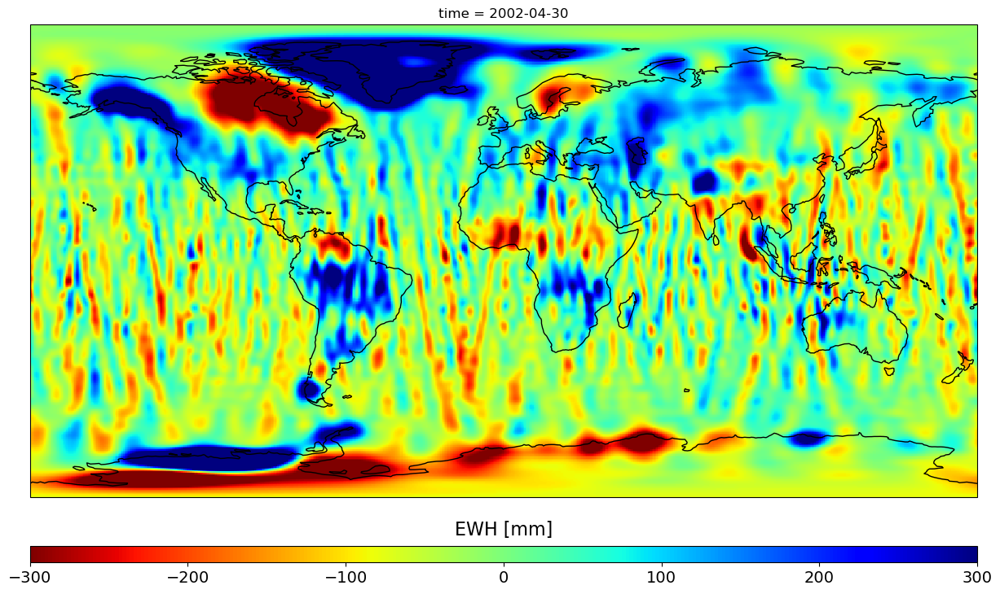

In [64]:
from matplotlib.ticker import FuncFormatter
from matplotlib.colors import TwoSlopeNorm

# tws_hhu = masked_solid_earth_correction_absolute_values['lwe_thickness'].isel(time=0)
tws_hhu = CSR_with_leakge_VLM_correct_April2002 #Total_Tws_Feilds_improved

# tws_hhu = tws_hhu.transpose('lat', 'lon')

vmin = -300
vmax = 300
norm = TwoSlopeNorm(vmin=vmin, vmax=vmax, vcenter=0)  # keeps color centered on zero

fig, ax = plt.subplots(figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# MAIN CHANGE: Do NOT pass 'levels' to imshow (or pcolormesh)
im = tws_hhu.plot.imshow(
    ax=ax,
    norm=norm,
    cmap='jet_r',  # continuous reversed jet colormap --- jet_r
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
# ax.add_feature(cfeature.BORDERS, linestyle=':')
# ax.set_title('Improved point mass solution (COST_G without Load Love number) - TWS Anomaly (April 2002)', fontsize=20, pad=15)

# Colorbar: by default matplotlib will give you a continuous colorbar
pos = ax.get_position()
cbar_left = pos.x0
cbar_width = pos.width * 1
cbar_bottom = pos.y0 - 0.08
cbar_height = 0.02

cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', shrink=0.9)
cbar.set_label('EWH [mm]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

# plt.savefig('IPM_COSTG_without_K_continuous.png')
plt.show()

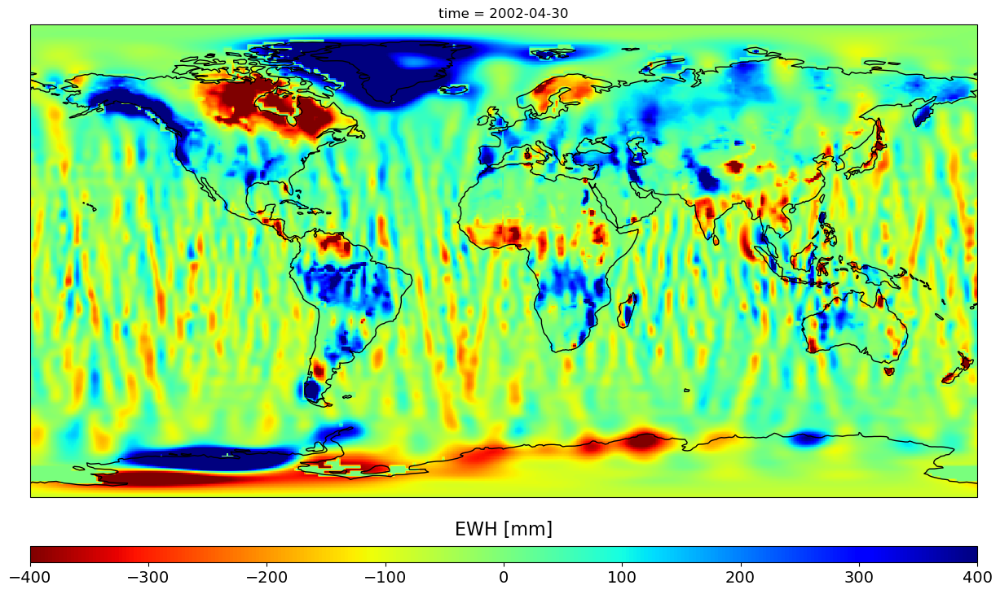

In [66]:
from matplotlib.ticker import FuncFormatter
from matplotlib.colors import TwoSlopeNorm

# tws_hhu = masked_solid_earth_correction_absolute_values['lwe_thickness'].isel(time=0)
tws_hhu = CSR_without_leakage_VLM_correct_April2002 #Total_Tws_Feilds_improved

# tws_hhu = tws_hhu.transpose('lat', 'lon')

vmin = -400
vmax = 400
norm = TwoSlopeNorm(vmin=vmin, vmax=vmax, vcenter=0)  # keeps color centered on zero

fig, ax = plt.subplots(figsize=(15, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# MAIN CHANGE: Do NOT pass 'levels' to imshow (or pcolormesh)
im = tws_hhu.plot.imshow(
    ax=ax,
    norm=norm,
    cmap='jet_r',  # continuous reversed jet colormap --- jet_r
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()
# ax.add_feature(cfeature.BORDERS, linestyle=':')
# ax.set_title('Improved point mass solution (COST_G without Load Love number) - TWS Anomaly (April 2002)', fontsize=20, pad=15)

# Colorbar: by default matplotlib will give you a continuous colorbar
pos = ax.get_position()
cbar_left = pos.x0
cbar_width = pos.width * 1
cbar_bottom = pos.y0 - 0.08
cbar_height = 0.02

cbar_ax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', shrink=0.9)
cbar.set_label('EWH [mm]', fontsize=16, labelpad=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.tick_params(labelsize=14)

# plt.savefig('IPM_COSTG_without_K_continuous.png')
plt.show()

In [67]:
# (CSR_with_leakge_GIA_correct['lwe_thickness'].isel(time=0), '(a.1)'),
# (CSR_without_leakge_GIA_correct['lwe_thickness'].isel(time=0), '(a.1)'),
# (CSR_with_leakge_VLM_correct['lwe_thickness'].isel(time=0), '(b.1)'),
# (CSR_without_leakage_VLM_correct['lwe_thickness'].isel(time=0), '(b.2)')

In [55]:
CSR_with_leakage_GIA_correct_lwe = CSR_with_leakge_GIA_correct['lwe_thickness']
CSR_without_leakage_GIA_correct_lwe = CSR_without_leakge_GIA_correct['lwe_thickness']
CSR_with_leakage_VLM_correct_lwe = CSR_with_leakge_VLM_correct['lwe_thickness']
CSR_without_leakage_VLM_correct_lwe = CSR_without_leakage_VLM_correct['lwe_thickness']

In [56]:
CSR_with_leakage_VLM_correct_lwe

<xarray.DataArray 'lwe_thickness' (time: 168, lat: 360, lon: 720)> Size: 348MB
[43545600 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
  * time     (time) datetime64[ns] 1kB 2002-04-30 2002-05-31 ... 2016-03-31
Attributes:
    units:    mm

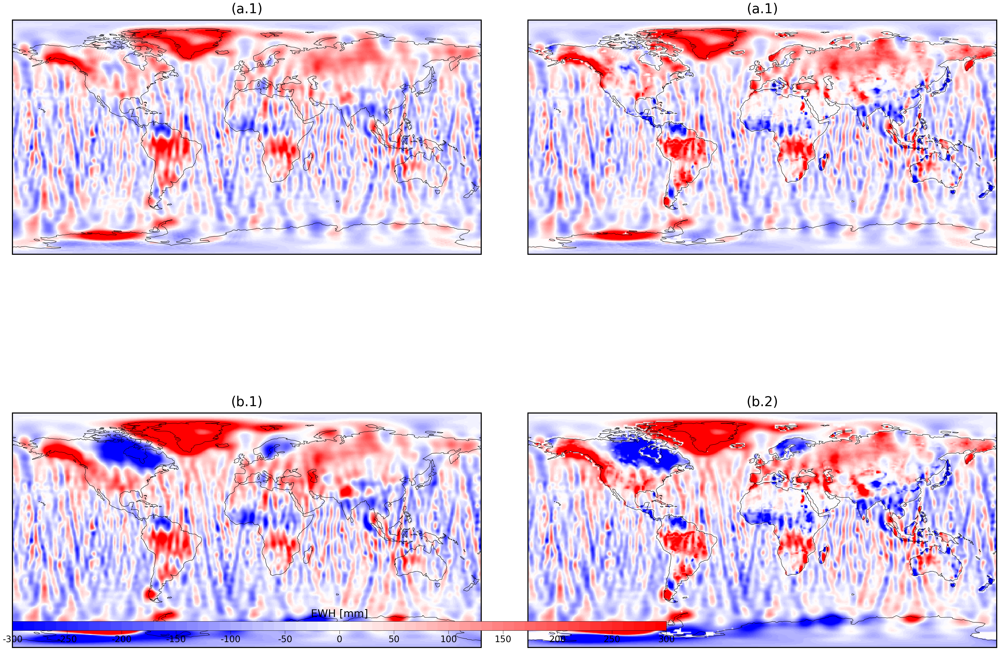

In [78]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.ticker import FuncFormatter
import matplotlib.colors as colors
import matplotlib.ticker as mticker

# Correct and monotonic irregular levels
levels = [
     -300, -290, -280, -270, -260,
    -250, -240, -230, -220, -210, -200, -190, -180, -170, -160, -150, -140, -130, -120,
    -110, -100, -90, -80, -70, -60, -50, -40, -30, -20, -10, 0,
    10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
    160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270,
    280, 290, 300
]

# Create BoundaryNorm
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256, clip=True)

datasets = [
    (CSR_with_leakage_GIA_correct_lwe.isel(time=0), '(a.1)'),
    (CSR_without_leakage_GIA_correct_lwe.isel(time=0), '(a.1)'),
    (CSR_with_leakage_VLM_correct_lwe.isel(time=0), '(b.1)'),
    (CSR_without_leakage_VLM_correct_lwe.isel(time=0), '(b.2)')
]

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(50, 40), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

for ax, (da, title) in zip(axes, datasets):
    im = da.plot.imshow(
        ax=ax,
        cmap="bwr",
        norm=norm,
        vmin=levels[0],
        vmax=levels[-1],
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        rasterized=True
    )
    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')
        
    
    ax.coastlines()
    ax.set_title(title, fontsize=38, fontweight='normal', pad=20)


    # ax.text(
    # 0.12, 0.5, title,
    # transform=ax.transAxes,
    # fontsize=30,
    # fontweight='bold',
    # ha='center',
    # va='top',
    # bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.3'))

# Define major ticks every 50 units
major_ticks = [v for v in levels if v % 50 == 0]

# Get horizontal extent spanning the first and last column subplots in bottom row
bottom_row = axes_2d[-1, :]
left = (bottom_row[0].get_position().x0) 
right = (bottom_row[1].get_position().x1) 
width = right - left

# Position the colorbar just below the bottom row, with some vertical padding
bottom = min(ax.get_position().y0 for ax in bottom_row) - 0.03
height = 0.009  # colorbar thickness

# Create an axes for the colorbar at calculated position
cbar_ax = fig.add_axes([left, bottom, width, height])

cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', boundaries=levels, norm=norm, ticks=major_ticks)
cbar.ax.set_xlabel("EWH [mm]", fontsize=30, weight='normal', labelpad=12)
cbar.ax.tick_params(labelsize=25, length=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}"))

cbar.minorticks_off()

plt.subplots_adjust(wspace=0.1, hspace=0.01)
#plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/Illustration_of_GF_without_SE_correction.png', dpi=300, bbox_inches='tight')
plt.show()

IndexError: index 2 is out of bounds for axis 0 with size 2

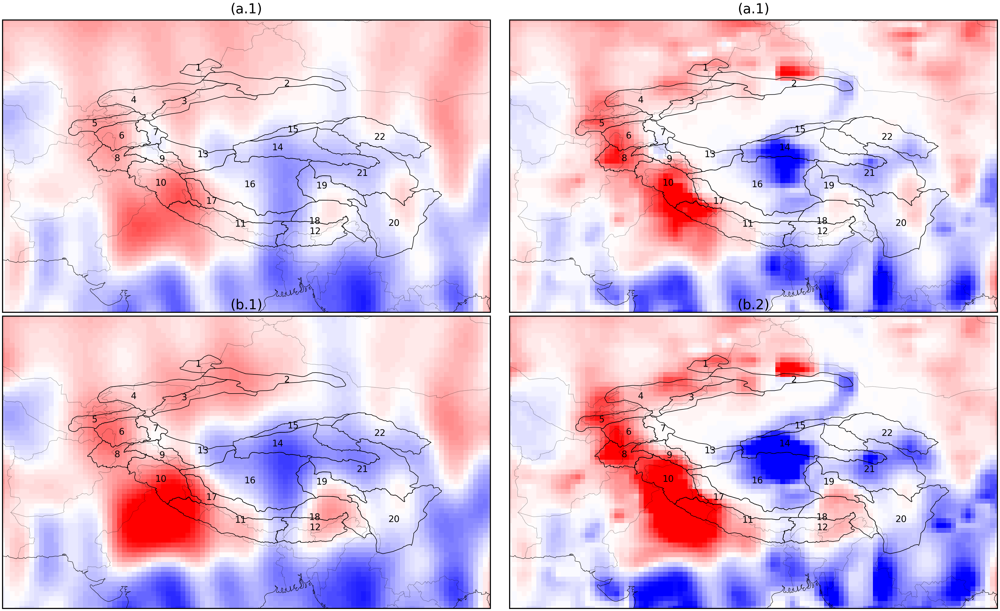

In [140]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.colors as colors
from matplotlib.ticker import FuncFormatter

# Read HMA boundary shapefile and project to WGS84
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# Region of interest (HMA)
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

levels = [
    -300, -290, -280, -270, -260,
    -250, -240, -230, -220, -210, -200, -190, -180, -170, -160, -150, -140, -130, -120,
    -110, -100, -90, -80, -70, -60, -50, -40, -30, -20, -10, 0,
    10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
    160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270,
    280, 290, 300
]
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256, clip=True)

datasets = [
    (CSR_with_leakage_GIA_correct_lwe.isel(time=0), '(a.1)'),
    (CSR_without_leakage_GIA_correct_lwe.isel(time=0), '(a.1)'),
    (CSR_with_leakage_VLM_correct_lwe.isel(time=0), '(b.1)'),
    (CSR_without_leakage_VLM_correct_lwe.isel(time=0), '(b.2)')
]

fig, axes_2d = plt.subplots(
    nrows=2, ncols=2, figsize=(50, 40),
    subplot_kw={'projection': ccrs.PlateCarree()},
    gridspec_kw={'wspace': 0.04, 'hspace': -0.4}
)
axes = axes_2d.flatten()

for ax, (da, title) in zip(axes, datasets):
    # da = ds['tws'].sel(time="2002-04-16", method='nearest')
    da_cropped = da.sel(lat=slice(lat_max, lat_min), lon=slice(lon_min, lon_max))

    im = da_cropped.plot.imshow(
        ax=ax,
        cmap="bwr",
        norm=norm,
        vmin=levels[0],
        vmax=levels[-1],
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        rasterized=True
    )

    for spine in ax.spines.values():
        spine.set_linewidth(3)
        spine.set_edgecolor('black')

    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.set_title(title, fontsize=38, fontweight='normal', pad=20)

    # Add HMA shapefile boundary to each subplot
    for geom in hma_boundary.geometry:
        ax.add_geometries([geom], crs=ccrs.PlateCarree(),
                          edgecolor='black', facecolor='none', linewidth=1.5)
    for idx, row in hma_boundary.iterrows():
            x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
            region_num = row['Region_No']  # Replace with your region number column name
            ax.text(x, y, str(region_num), fontsize=25, ha='center', va='center', transform=ccrs.PlateCarree())

# Define major ticks every 50 units
major_ticks = [v for v in levels if v % 50 == 0]

# Place the colorbar below (3,2) subplot at index [2,1]
target_ax = axes_2d[2, 1]
pos = target_ax.get_position()

# Get position of target subplot
pos = target_ax.get_position()

# Increase width beyond subplot width for longer colorbar
width = pos.width * 1.4  # 20% longer on total width

# Shift left to keep colorbar centered under subplot (subtract half the extra width)
left = pos.x0 - (width - pos.width) / 2

bottom = pos.y0 - 0.035  # vertical offset (adjust if needed)
height = 0.01  # colorbar thickness

# Create colorbar axes with updated position and width
cbar_ax = fig.add_axes([left, bottom, width, height])

cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal',
                    boundaries=levels, norm=norm, ticks=major_ticks)

cbar.ax.set_xlabel("EWH [mm]", fontsize=36, weight='normal', labelpad=12)
cbar.ax.tick_params(labelsize=34, length=10)
cbar.ax.xaxis.set_label_position('top')
cbar.ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x)}"))
cbar.minorticks_off()

#plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/SE_corrected_secular_nonsecular_totalEWH_3datasets.png', dpi=300, bbox_inches='tight')
plt.show()

In [66]:
CSR_without_leakage_GIA_correct_EWH = CSR_without_leakage_GIA_correct_lwe.isel(time=0)
CSR_without_leakage_GIA_correct_EWH 

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[-36.75263849, -36.76306102, -36.77352474, ..., -36.72162753,
        -36.7319208 , -36.7422581 ],
       [-37.01503938, -37.05222951, -37.08961439, ..., -36.90470347,
        -36.94126982, -36.97805063],
       [-35.33966733, -35.41890548, -35.49864018, ..., -35.10514353,
        -35.18276549, -35.260947  ],
       ...,
       [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
        -44.67750286, -44.62132682],
       [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
        -43.22009754, -43.18700463],
       [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
        -41.40830172, -41.39784015]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2003...
    units:        mm we

In [67]:
CSR_without_leakage_VLM_correct_EWH = CSR_without_leakage_VLM_correct_lwe.isel(time=0)
CSR_without_leakage_VLM_correct_EWH 

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30

In [68]:
jpl_halfdegree_gms = xr.open_dataset(r'GRCTellus.JPL.200204_202408.GLO.RL06.3M.MSCNv04CRI.nc')
jpl_halfdegree_gms

<xarray.Dataset> Size: 1GB
Dimensions:        (lon: 720, lat: 360, time: 236, bounds: 2)
Coordinates:
  * lon            (lon) float64 6kB 0.25 0.75 1.25 1.75 ... 358.8 359.2 359.8
  * lat            (lat) float64 3kB -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
  * time           (time) datetime64[ns] 2kB 2002-04-17T12:00:00 ... 2024-08-...
Dimensions without coordinates: bounds
Data variables:
    lwe_thickness  (time, lat, lon) float64 489MB ...
    uncertainty    (time, lat, lon) float64 489MB ...
    lat_bounds     (lat, bounds) float64 6kB ...
    lon_bounds     (lon, bounds) float64 12kB ...
    time_bounds    (time, bounds) datetime64[ns] 4kB ...
    land_mask      (lat, lon) float64 2MB ...
    scale_factor   (lat, lon) float64 2MB ...
    mascon_ID      (lat, lon) float64 2MB ...
    GAD            (time, lat, lon) float64 489MB ...
Attributes: (12/53)
    Conventions:                   CF-1.6, ACDD-1.3, ISO 8601
    Metadata_Conventions:          Unidata Dataset Discovery v1.0
    standard_name_vocabulary:      NetCDF Climate and Forecast (CF) Metadata ...
    title:                         JPL GRACE and GRACE-FO MASCON RL06.3Mv04 CRI
    summary:                       Monthly gravity solutions from GRACE and G...
    keywords:                      Solid Earth, Geodetics/Gravity, Gravity, l...
    ...                            ...
    C_30_substitution:             TN-14; Loomis et al., 2019, Geophys. Res. ...
    user_note_1:                   The accelerometer on the GRACE-B spacecraf...
    user_note_2:                   The accelerometer on the GRACE-D spacecraf...
    journal_reference:             Watkins, M. M., D. N. Wiese, D.-N. Yuan, C...
    CRI_filter_journal_reference:  Wiese, D. N., F. W. Landerer, and M. M. Wa...
    date_created:                  2024-11-04T07:11:08Z

In [69]:
jpl_land_mask = jpl_halfdegree_gms.land_mask
jpl_land_mask

<xarray.DataArray 'land_mask' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.25 0.75 1.25 1.75 ... 358.2 358.8 359.2 359.8
  * lat      (lat) float64 3kB -89.75 -89.25 -88.75 -88.25 ... 88.75 89.25 89.75
Attributes:
    units:          binary
    long_name:      Land_Mask
    standard_name:  Land_Mask
    description:    Land Mask that was used with the CRI filter

In [70]:
# Assume `ds` is your xarray dataset
ds_jpl = jpl_halfdegree_gms.land_mask  # Replace with your actual dataset

# Shift latitude and longitude
shifted_lon = (ds_jpl['lon'] - 0.25) % 360  # Wrap around [0, 360)
shifted_lat = ds_jpl['lat'] - 0.25

# Update the dataset with the corrected coordinates
corrected_ds_jpl = ds_jpl.copy()
corrected_ds_jpl = corrected_ds_jpl.assign_coords(lon=shifted_lon, lat=shifted_lat)

# Sort longitude to ensure proper ordering after the shift
corrected_ds_jpl = corrected_ds_jpl.sortby('lon')

# Display the corrected dataset
corrected_ds_jpl

<xarray.DataArray 'land_mask' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.0 88.5 89.0 89.5
Attributes:
    units:          binary
    long_name:      Land_Mask
    standard_name:  Land_Mask
    description:    Land Mask that was used with the CRI filter

In [71]:
corrected_ds_jpl.values

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(360, 720))

In [72]:
masked_solid_earth_EWH_absolute_correction = EWH_absolute_correction.lwe_thickness.where(corrected_ds_jpl == 1)
masked_solid_earth_EWH_absolute_correction

NameError: name 'EWH_absolute_correction' is not defined

In [73]:
masked_CSR_without_leakage_GIA_correct = CSR_without_leakage_GIA_correct_lwe.isel(time=0).where(corrected_ds_jpl == 1)
masked_CSR_without_leakage_GIA_correct

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       ...,
       [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
        -44.67750286, -44.62132682],
       [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
        -43.22009754, -43.18700463],
       [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
        -41.40830172, -41.39784015]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2003...
    units:        mm we

In [74]:
masked_CSR_without_leakage_GIA_correct_filled = masked_CSR_without_leakage_GIA_correct.fillna(0)
masked_CSR_without_leakage_GIA_correct_filled

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
        -44.67750286, -44.62132682],
       [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
        -43.22009754, -43.18700463],
       [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
        -41.40830172, -41.39784015]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2003...
    units:        mm we

In [75]:
masked_CSR_without_leakage_VLM_correct = CSR_without_leakage_VLM_correct_lwe.isel(time=0).where(corrected_ds_jpl == 1)
masked_CSR_without_leakage_VLM_correct 

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       ...,
       [-81.2255501 , -81.12388727, -81.02255549, ..., -81.53255952,
        -81.4298796 , -81.32754459],
       [-79.58959078, -79.52576113, -79.46214246, ..., -79.78230398,
        -79.71786048, -79.6536236 ],
       [-79.04713443, -79.02486886, -79.00265293, ..., -79.11424409,
        -79.09182206, -79.06945344]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30

In [76]:
masked_CSR_without_leakage_VLM_correct_filled = masked_CSR_without_leakage_VLM_correct.fillna(0)
masked_CSR_without_leakage_VLM_correct_filled

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [-81.2255501 , -81.12388727, -81.02255549, ..., -81.53255952,
        -81.4298796 , -81.32754459],
       [-79.58959078, -79.52576113, -79.46214246, ..., -79.78230398,
        -79.71786048, -79.6536236 ],
       [-79.04713443, -79.02486886, -79.00265293, ..., -79.11424409,
        -79.09182206, -79.06945344]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30

-------
------

In [77]:
CSR_with_leakage_GIA_correct_lwe.isel(time=0)

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[-36.75263849, -36.76306102, -36.77352474, ..., -36.72162753,
        -36.7319208 , -36.7422581 ],
       [-37.01503938, -37.05222951, -37.08961439, ..., -36.90470347,
        -36.94126982, -36.97805063],
       [-35.33966733, -35.41890548, -35.49864018, ..., -35.10514353,
        -35.18276549, -35.260947  ],
       ...,
       [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
        -44.67750286, -44.62132682],
       [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
        -43.22009754, -43.18700463],
       [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
        -41.40830172, -41.39784015]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2003...
    units:        mm we

In [78]:
masked_CSR_without_leakage_GIA_correct_filled

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [-44.56539175, -44.50969424, -44.454231  , ..., -44.73392337,
        -44.67750286, -44.62132682],
       [-43.1540815 , -43.12133006, -43.0887522 , ..., -43.25335833,
        -43.22009754, -43.18700463],
       [-41.38742089, -41.37704472, -41.3667124 , ..., -41.41880479,
        -41.40830172, -41.39784015]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2003...
    units:        mm we

-----
------

In [79]:
CSR_leakage_amount_with_GIA_correction = masked_CSR_without_leakage_GIA_correct_filled - CSR_with_leakage_GIA_correct_lwe.isel(time=0)
CSR_leakage_amount_with_GIA_correction_xr = xr.DataArray(
    CSR_leakage_amount_with_GIA_correction,
    coords=masked_CSR_without_leakage_GIA_correct_filled.coords,
    dims=masked_CSR_without_leakage_GIA_correct_filled.dims,
    attrs=masked_CSR_without_leakage_GIA_correct_filled.attrs
)
CSR_leakage_amount_with_GIA_correction_xr

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[36.75263849, 36.76306102, 36.77352474, ..., 36.72162753,
        36.7319208 , 36.7422581 ],
       [37.01503938, 37.05222951, 37.08961439, ..., 36.90470347,
        36.94126982, 36.97805063],
       [35.33966733, 35.41890548, 35.49864018, ..., 35.10514353,
        35.18276549, 35.260947  ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    description:  Global gridded TWS Anomaly corresponding to long term (2003...
    units:        mm we

-----
------

In [80]:
masked_CSR_without_leakage_VLM_correct_filled

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [-81.2255501 , -81.12388727, -81.02255549, ..., -81.53255952,
        -81.4298796 , -81.32754459],
       [-79.58959078, -79.52576113, -79.46214246, ..., -79.78230398,
        -79.71786048, -79.6536236 ],
       [-79.04713443, -79.02486886, -79.00265293, ..., -79.11424409,
        -79.09182206, -79.06945344]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30

In [81]:
CSR_with_leakage_VLM_correct_lwe.isel(time=0)

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
[259200 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30
Attributes:
    units:    mm

In [82]:
CSR_leakage_amount_with_VLM_correction = masked_CSR_without_leakage_VLM_correct_filled - CSR_with_leakage_VLM_correct_lwe.isel(time=0)
CSR_leakage_amount_with_VLM_correction_xr = xr.DataArray(
    CSR_leakage_amount_with_VLM_correction,
    coords=masked_CSR_without_leakage_VLM_correct_filled.coords,
    dims=masked_CSR_without_leakage_VLM_correct_filled.dims,
    attrs=masked_CSR_without_leakage_VLM_correct_filled.attrs
)
CSR_leakage_amount_with_VLM_correction_xr

<xarray.DataArray 'lwe_thickness' (lat: 360, lon: 720)> Size: 2MB
array([[14.29024373, 14.30680619, 14.32342735, ..., 14.24093098,
        14.25730525, 14.27374328],
       [12.55618482, 12.61642414, 12.67685946, ..., 12.37674377,
        12.4363356 , 12.49615228],
       [10.20022863, 10.32840773, 10.45692413, ...,  9.81800244,
         9.94499672, 10.07241495],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]], shape=(360, 720))
Coordinates:
  * lon      (lon) float64 6kB 0.0 0.5 1.0 1.5 2.0 ... 358.0 358.5 359.0 359.5
  * lat      (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -88.5 -89.0 -89.5 -90.0
    time     datetime64[ns] 8B 2002-04-30

--------

In [83]:
Half_degree_SF = xr.open_dataset(r'Scale_factor_half_degree_renamed_full_range.nc')
Half_degree_SF

<xarray.Dataset> Size: 2MB
Dimensions:       (lon: 720, lat: 360)
Coordinates:
  * lon           (lon) float64 6kB 0.0 0.5 1.0 1.5 ... 358.0 358.5 359.0 359.5
  * lat           (lat) float64 3kB 89.5 89.0 88.5 88.0 ... -89.0 -89.5 -90.0
Data variables:
    SCALE_FACTOR  (lat, lon) float64 2MB ...

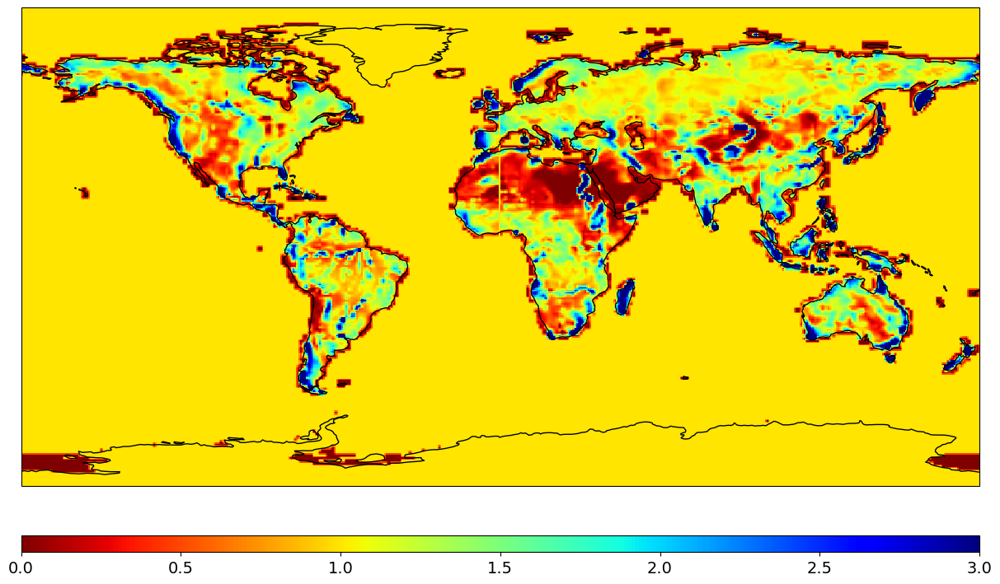

In [84]:
from matplotlib.ticker import FuncFormatter
from matplotlib.colors import TwoSlopeNorm

tws_hhu = Half_degree_SF['SCALE_FACTOR']   # <-- IMPORTANT

vmin = 0
vmax = 3
norm = TwoSlopeNorm(vmin=vmin, vmax=vmax, vcenter=1.5)

fig, ax = plt.subplots(figsize=(15, 10),
                       subplot_kw={'projection': ccrs.PlateCarree()})

im = tws_hhu.plot.imshow(
    ax=ax,
    norm=norm,
    cmap='jet_r',
    transform=ccrs.PlateCarree(),
    add_colorbar=False
)

ax.coastlines()

pos = ax.get_position()
cbar_ax = fig.add_axes([pos.x0, pos.y0 - 0.08, pos.width, 0.02])

cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.ax.tick_params(labelsize=14)

plt.show()

--------

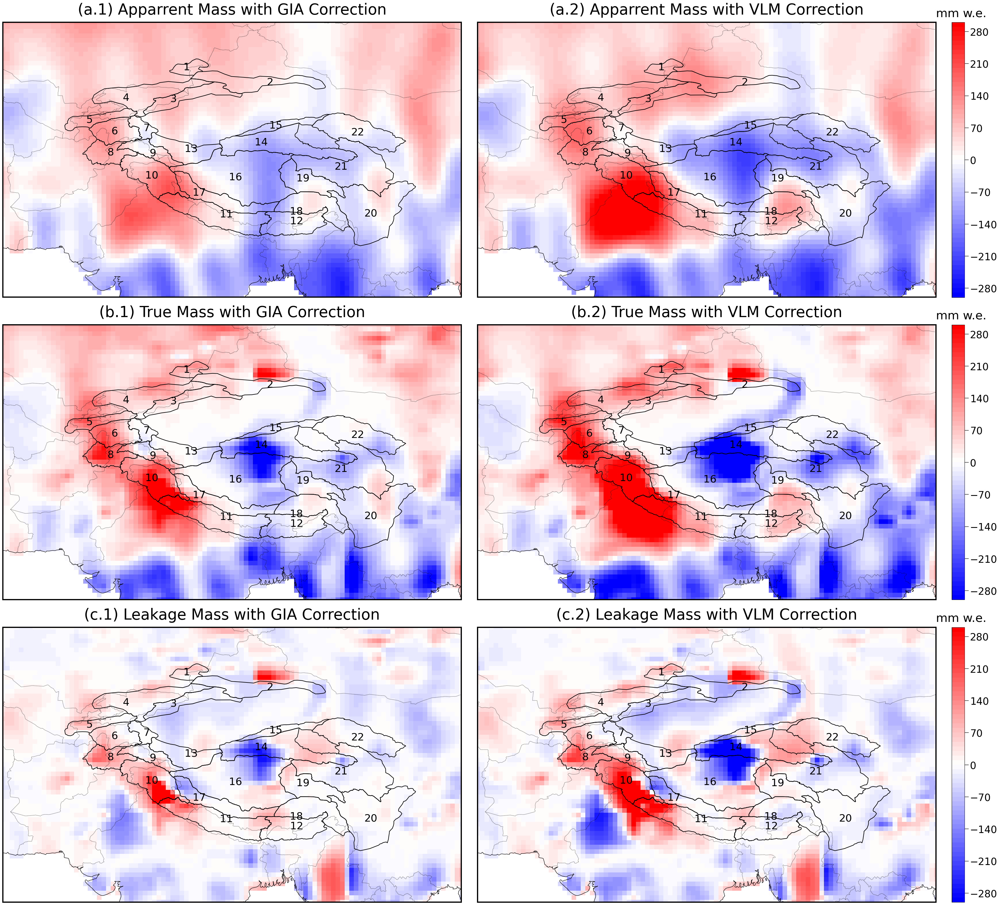

In [172]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as colors
from matplotlib.ticker import FuncFormatter

# Read HMA boundary shapefile and project to WGS84
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

# Region of interest (HMA)
lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

levels = [
    -300, -290, -280, -270, -260,
    -250, -240, -230, -220, -210, -200, -190, -180, -170, -160, -150, -140, -130, -120,
    -110, -100, -90, -80, -70, -60, -50, -40, -30, -20, -10, 0,
    10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
    160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270,
    280, 290, 300
]
norm = colors.BoundaryNorm(boundaries=levels, ncolors=256, clip=True)

datasets = [
    (CSR_with_leakage_GIA_correct_lwe.isel(time=0).where(corrected_ds_jpl == 1), '(a.1) Apparrent Mass with GIA Correction'),
    (CSR_with_leakage_VLM_correct_lwe.isel(time=0).where(corrected_ds_jpl == 1), '(a.2) Apparrent Mass with VLM Correction'),
    
    (masked_CSR_without_leakage_GIA_correct, '(b.1) True Mass with GIA Correction'),
    (masked_CSR_without_leakage_VLM_correct, '(b.2) True Mass with VLM Correction'),

    (CSR_leakage_amount_with_GIA_correction_xr.where(corrected_ds_jpl == 1), '(c.1) Leakage Mass with GIA Correction'),
    (CSR_leakage_amount_with_VLM_correction_xr.where(corrected_ds_jpl == 1), '(c.2) Leakage Mass with VLM Correction')
]

fig, axes_2d = plt.subplots(
    nrows=3, ncols=2, figsize=(50, 40),
    subplot_kw={'projection': ccrs.PlateCarree()},
    gridspec_kw={'wspace': -0.25, 'hspace': 0.1}
)
axes = axes_2d.flatten()

major_ticks = [v for v in levels if v % 50 == 0]

ims = []  # Store images of each subplot

for i_row in range(3):
    row_ims = []
    for i_col in range(2):
        ax = axes_2d[i_row, i_col]
        da, title = datasets[i_row*2 + i_col]
        da_cropped = da.sel(lat=slice(lat_max, lat_min), lon=slice(lon_min, lon_max))
        
        im = da_cropped.plot.imshow(
            ax=ax,
            cmap="bwr",
            norm=norm,
            vmin=levels[0],
            vmax=levels[-1],
            transform=ccrs.PlateCarree(),
            add_colorbar=False,
            rasterized=True
        )
        
        for spine in ax.spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')

        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
        ax.set_title(title, fontsize=38, fontweight='normal', pad=20)

        # Plot HMA shapefile boundaries and region numbers
        for geom in hma_boundary.geometry:
            ax.add_geometries([geom], crs=ccrs.PlateCarree(),
                              edgecolor='black', facecolor='none', linewidth=1.5)

        for idx, row in hma_boundary.iterrows():
            x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
            region_num = row['Region_No']
            ax.text(x, y, str(region_num), fontsize=26, ha='center', va='center', transform=ccrs.PlateCarree())

        row_ims.append(im)
    ims.append(row_ims)

# Add one vertical colorbar per row, right side aligned
# Add one vertical colorbar per row, right side aligned
for i, ax_row in enumerate(axes_2d):
    pos = ax_row[1].get_position()  # rightmost subplot in the row
    cbar_ax = fig.add_axes([0.85, pos.y0, 0.009, pos.height])
    cbar = fig.colorbar(ims[i][0], cax=cbar_ax, orientation='vertical')  # Use first im in row

    cbar.set_label('', fontsize=26, labelpad=15)
    cbar.ax.minorticks_off()  # Turn off minor tick labels
    
    cbar_ax.text(0.75, 1.01, 'mm w.e.', ha='center', va='bottom', fontsize=30, transform=cbar_ax.transAxes)
    cbar.ax.tick_params(labelsize=25, length=10, width=1, direction='out', bottom=True, top=True)


plt.show()

In [173]:
sf =  Half_degree_SF['SCALE_FACTOR'].values
sf

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], shape=(360, 720))

In [174]:
max_sf_value = np.nanmax(sf)
max_sf_value

np.float64(15.02741801738739)

------

-------

In [175]:
vmin = np.nanmin(sf)
vmax = np.nanmax(sf)
vmin, vmax

(np.float64(-3.051480293273926), np.float64(15.02741801738739))

In [176]:
levels_sf = np.arange(vmin, vmax + 0.1, 0.1)
norm_sf = colors.BoundaryNorm(levels_sf, ncolors=256, clip=True)


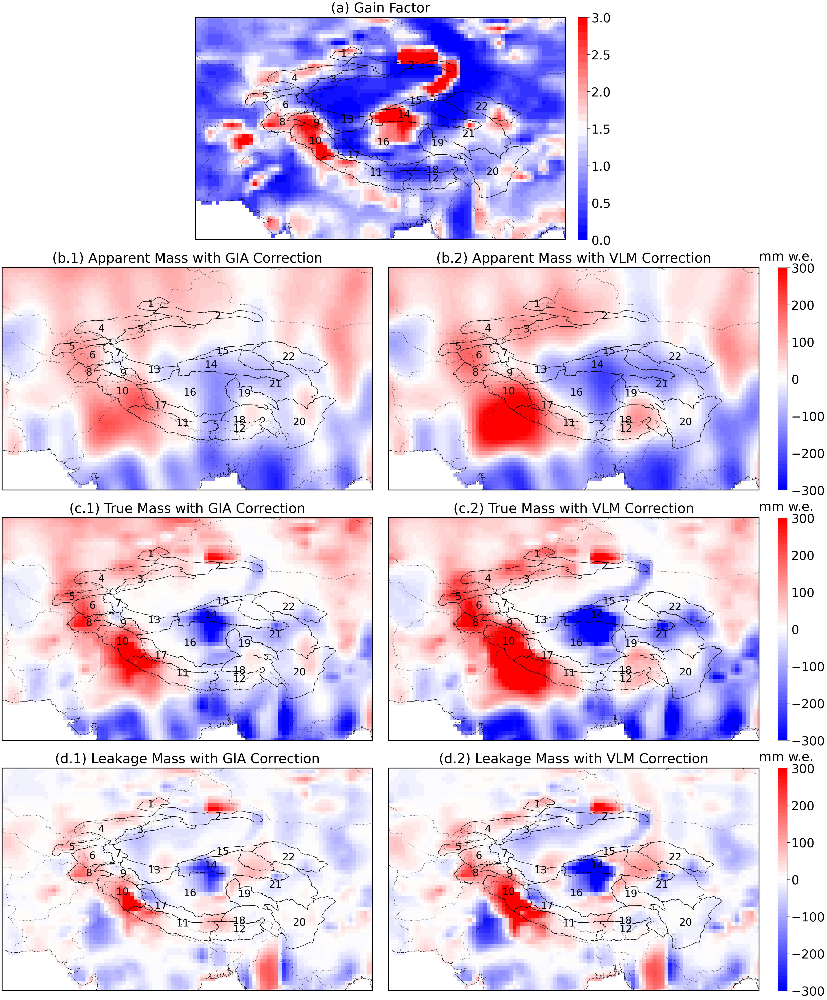

In [85]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as colors
from matplotlib.gridspec import GridSpec

# Read HMA shapefile and project to EPSG:4326
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# Level boundaries and norms
# levels_sf = [-4, -3.75, -3.50, -3.25, -3.0, -2.75, -2.50, -2.25, -2.0, -1.75, -1.50, -1.25, -1.0, -0.75, -0.50, -0.25, 0, 0.25, 0.50, 0.75, 1.0, 1.25, 1.50, 1.75, 2.0, 2.25, 2.50, 2.75, 3.0, 3.25, 3.50, 4.0]

levels_sf = list(np.arange(0, 3.1, 0.1)) 
norm_sf = colors.BoundaryNorm(levels_sf, ncolors=256, clip=True)

# Define major ticks at coarser interval, e.g., 0.5
major_ticks = np.arange(0, 3.1, 0.5)

levels_mass = [
    -300, -290, -280, -270, -260, -250, -240, -230,
    -220, -210, -200, -190, -180, -170, -160, -150,
    -140, -130, -120, -110, -100, -90, -80, -70,
    -60, -50, -40, -30, -20, -10, 0, 10, 20,
    30, 40, 50, 60, 70, 80, 90, 100, 110, 120,
    130, 140, 150, 160, 170, 180, 190, 200, 210,
    220, 230, 240, 250, 260, 270, 280, 290, 300
]

major_ticks_others = np.arange(-300, 310, 100)

norm_mass = colors.BoundaryNorm(levels_mass, ncolors=256, clip=True)

datasets = [
    (Half_degree_SF['SCALE_FACTOR'].sel(lat=slice(lat_max, lat_min),
                                        lon=slice(lon_min, lon_max)).where(corrected_ds_jpl == 1), '(a) Gain Factor'),

    (CSR_with_leakage_GIA_correct_lwe.isel(time=0).where(corrected_ds_jpl == 1), '(b.1) Apparent Mass with GIA Correction'),
    (CSR_with_leakage_VLM_correct_lwe.isel(time=0).where(corrected_ds_jpl == 1), '(b.2) Apparent Mass with VLM Correction'),

    (masked_CSR_without_leakage_GIA_correct, '(c.1) True Mass with GIA Correction'),
    (masked_CSR_without_leakage_VLM_correct, '(c.2) True Mass with VLM Correction'),

    (CSR_leakage_amount_with_GIA_correction_xr.where(corrected_ds_jpl == 1), '(d.1) Leakage Mass with GIA Correction'),
    (CSR_leakage_amount_with_VLM_correction_xr.where(corrected_ds_jpl == 1), '(d.2) Leakage Mass with VLM Correction')
]

fig = plt.figure(figsize=(50, 60))
gs = GridSpec(nrows=4, ncols=2, figure=fig, wspace=-0.1, hspace=0.125)
# 'wspace': -0.25, 'hspace': 0.1
ims = []

# Top row: scale factor spanning both columns
ax_sf = fig.add_subplot(gs[0, :], projection=ccrs.PlateCarree())
da_sf, title_sf = datasets[0]
im_sf = da_sf.plot.imshow(
    ax=ax_sf, cmap='bwr', norm=norm_sf,
    transform=ccrs.PlateCarree(), add_colorbar=False, rasterized=True
)
ims.append(im_sf)
ax_sf.coastlines()
ax_sf.add_feature(cfeature.BORDERS, linestyle=':')
ax_sf.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
ax_sf.set_title(title_sf, fontsize=46, y=1.015)

for spine in ax_sf.spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')


for geom in hma_boundary.geometry:
    ax_sf.add_geometries([geom], crs=ccrs.PlateCarree(),
                        edgecolor='black', facecolor='none', linewidth=1.5)
for idx, row in hma_boundary.iterrows():
    x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
    ax_sf.text(x, y, str(row['Region_No']), fontsize=35,
               ha='center', va='center', transform=ccrs.PlateCarree())

# Rows 2 to 4: two columns each
for i in range(1, 7):
    ax = fig.add_subplot(gs[1 + (i - 1)//2, (i - 1) % 2], projection=ccrs.PlateCarree())
    da, title = datasets[i]
    da_cropped = da.sel(lat=slice(lat_max, lat_min),
                        lon=slice(lon_min, lon_max))
    im = da_cropped.plot.imshow(
        ax=ax, cmap='bwr', norm=norm_mass,
        transform=ccrs.PlateCarree(), add_colorbar=False,
        rasterized=True
    )
    ims.append(im)
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_extent([lon_min, lon_max, lat_min, lat_max],
                  crs=ccrs.PlateCarree())
    ax.set_title(title, fontsize=46, y=1.015)

    for spine in ax.spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')


    
    for geom in hma_boundary.geometry:
        ax.add_geometries([geom], crs=ccrs.PlateCarree(),
                          edgecolor='black', facecolor='none',
                          linewidth=1.5)
    for idx, row in hma_boundary.iterrows():
        x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
        ax.text(x, y, str(row['Region_No']), fontsize=35,
                ha='center', va='center', transform=ccrs.PlateCarree())

# Colorbar for scale factor (top)
pos_sf = ax_sf.get_position()
cbar_ax_sf = fig.add_axes([0.70, pos_sf.y0, 0.009, pos_sf.height])
im_sf.set_clim(levels_sf[0], levels_sf[-1])

cbar_sf = fig.colorbar(im_sf, cax=cbar_ax_sf, orientation='vertical')

cbar_sf.ax.minorticks_off()
cbar_sf.set_ticks(major_ticks)
cbar_sf.ax.tick_params(labelsize=42, length=10, width=1,
                       direction='out', bottom=True, top=True)

# Add one vertical colorbar per row for rows 2 to 4
for i in range(1, 4):
    left_ax = fig.axes[2*(i-1)+1]  # Left subplot in row
    right_ax = fig.axes[2*(i-1)+2]  # Right subplot in row
    pos_left = left_ax.get_position()
    pos_right = right_ax.get_position()
    y_bottom = min(pos_left.y0, pos_right.y0)
    y_top = max(pos_left.y0 + pos_left.height, pos_right.y0 + pos_right.height)
    height = y_top - y_bottom
    cbar_ax = fig.add_axes([0.89, y_bottom, 0.009, height])
    im = ims[2*(i-1)+1]
    im.set_clim(levels_mass[0], levels_mass[-1])
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
    # cbar.set_label('', fontsize=26, labelpad=15)
    cbar.set_ticks(major_ticks_others)
    cbar.ax.minorticks_off()
  
    cbar_ax.text(0.89, 1.02, 'mm w.e.', ha='center',
                 va='bottom', fontsize=44, transform=cbar_ax.transAxes)
    cbar.ax.tick_params(labelsize=42, length=10, width=1,
                        direction='out', bottom=True, top=True)

plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/GainFactor_Apparrent_True_LeakageMass2.png', dpi=200, bbox_inches='tight')
plt.show()

------
------


## NEW ONE

In [75]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as colors
from matplotlib.gridspec import GridSpec

# Read HMA shapefile and project to EPSG:4326
hma_shapefile = r'D:\MSRSGI\Masters_thesis\Data\HMA_Region_Shapefiles\Regions_shapefiles\New folder\TotalHMA_boundary1_22.shp'
hma_boundary = gpd.read_file(hma_shapefile).to_crs("EPSG:4326")

lon_min, lon_max = 60, 110
lat_min, lat_max = 20, 50

# Level boundaries and norms
# levels_sf = [-4, -3.75, -3.50, -3.25, -3.0, -2.75, -2.50, -2.25, -2.0, -1.75, -1.50, -1.25, -1.0, -0.75, -0.50, -0.25, 0, 0.25, 0.50, 0.75, 1.0, 1.25, 1.50, 1.75, 2.0, 2.25, 2.50, 2.75, 3.0, 3.25, 3.50, 4.0]

levels_sf = list(np.arange(0, 3.1, 0.1)) 
norm_sf = colors.BoundaryNorm(levels_sf, ncolors=256, clip=True)

# Define major ticks at coarser interval, e.g., 0.5
major_ticks = np.arange(0, 3.1, 0.5)

levels_mass = [
    -300, -290, -280, -270, -260, -250, -240, -230,
    -220, -210, -200, -190, -180, -170, -160, -150,
    -140, -130, -120, -110, -100, -90, -80, -70,
    -60, -50, -40, -30, -20, -10, 0, 10, 20,
    30, 40, 50, 60, 70, 80, 90, 100, 110, 120,
    130, 140, 150, 160, 170, 180, 190, 200, 210,
    220, 230, 240, 250, 260, 270, 280, 290, 300
]

major_ticks_others = np.arange(-300, 310, 100)

norm_mass = colors.BoundaryNorm(levels_mass, ncolors=256, clip=True)

datasets = [
    (Half_degree_SF['SCALE_FACTOR'].sel(lat=slice(lat_max, lat_min),
                                        lon=slice(lon_min, lon_max)), '(a) Gain Factor'),

    (CSR_with_leakage_GIA_correct_lwe.isel(time=0), '(b.1) Apparent Mass with GIA Correction'),
    (CSR_with_leakage_VLM_correct_lwe.isel(time=0), '(b.2) Apparent Mass with VLM Correction'),

    (masked_CSR_without_leakage_GIA_correct, '(c.1) True Mass with GIA Correction'),
    (masked_CSR_without_leakage_VLM_correct, '(c.2) True Mass with VLM Correction'),

    (CSR_leakage_amount_with_GIA_correction_xr, '(d.1) Leakage Mass with GIA Correction'),
    (CSR_leakage_amount_with_VLM_correction_xr, '(d.2) Leakage Mass with VLM Correction')
]

fig = plt.figure(figsize=(50, 60))
gs = GridSpec(nrows=4, ncols=2, figure=fig, wspace=-0.1, hspace=0.125)
# 'wspace': -0.25, 'hspace': 0.1
ims = []

# Top row: scale factor spanning both columns
ax_sf = fig.add_subplot(gs[0, :], projection=ccrs.PlateCarree())
da_sf, title_sf = datasets[0]
im_sf = da_sf.plot.imshow(
    ax=ax_sf, cmap='bwr', norm=norm_sf,
    transform=ccrs.PlateCarree(), add_colorbar=False, rasterized=True
)
ims.append(im_sf)
ax_sf.coastlines()
ax_sf.add_feature(cfeature.BORDERS, linestyle=':')
ax_sf.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
ax_sf.set_title(title_sf, fontsize=46, y=1.015)

for spine in ax_sf.spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')


for geom in hma_boundary.geometry:
    ax_sf.add_geometries([geom], crs=ccrs.PlateCarree(),
                        edgecolor='black', facecolor='none', linewidth=1.5)
for idx, row in hma_boundary.iterrows():
    x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
    ax_sf.text(x, y, str(row['Region_No']), fontsize=35,
               ha='center', va='center', transform=ccrs.PlateCarree())

# Rows 2 to 4: two columns each
for i in range(1, 7):
    ax = fig.add_subplot(gs[1 + (i - 1)//2, (i - 1) % 2], projection=ccrs.PlateCarree())
    da, title = datasets[i]
    da_cropped = da.sel(lat=slice(lat_max, lat_min),
                        lon=slice(lon_min, lon_max))
    im = da_cropped.plot.imshow(
        ax=ax, cmap='bwr', norm=norm_mass,
        transform=ccrs.PlateCarree(), add_colorbar=False,
        rasterized=True
    )
    ims.append(im)
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.set_extent([lon_min, lon_max, lat_min, lat_max],
                  crs=ccrs.PlateCarree())
    ax.set_title(title, fontsize=46, y=1.015)

    for spine in ax.spines.values():
            spine.set_linewidth(3)
            spine.set_edgecolor('black')


    
    for geom in hma_boundary.geometry:
        ax.add_geometries([geom], crs=ccrs.PlateCarree(),
                          edgecolor='black', facecolor='none',
                          linewidth=1.5)
    for idx, row in hma_boundary.iterrows():
        x, y = row.geometry.representative_point().x, row.geometry.representative_point().y
        ax.text(x, y, str(row['Region_No']), fontsize=35,
                ha='center', va='center', transform=ccrs.PlateCarree())

# Colorbar for scale factor (top)
pos_sf = ax_sf.get_position()
cbar_ax_sf = fig.add_axes([0.70, pos_sf.y0, 0.009, pos_sf.height])
im_sf.set_clim(levels_sf[0], levels_sf[-1])

cbar_sf = fig.colorbar(im_sf, cax=cbar_ax_sf, orientation='vertical')

cbar_sf.ax.minorticks_off()
cbar_sf.set_ticks(major_ticks)
cbar_sf.ax.tick_params(labelsize=42, length=10, width=1,
                       direction='out', bottom=True, top=True)

# Add one vertical colorbar per row for rows 2 to 4
for i in range(1, 4):
    left_ax = fig.axes[2*(i-1)+1]  # Left subplot in row
    right_ax = fig.axes[2*(i-1)+2]  # Right subplot in row
    pos_left = left_ax.get_position()
    pos_right = right_ax.get_position()
    y_bottom = min(pos_left.y0, pos_right.y0)
    y_top = max(pos_left.y0 + pos_left.height, pos_right.y0 + pos_right.height)
    height = y_top - y_bottom
    cbar_ax = fig.add_axes([0.89, y_bottom, 0.009, height])
    im = ims[2*(i-1)+1]
    im.set_clim(levels_mass[0], levels_mass[-1])
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
    # cbar.set_label('', fontsize=26, labelpad=15)
    cbar.set_ticks(major_ticks_others)
    cbar.ax.minorticks_off()
  
    cbar_ax.text(0.89, 1.02, 'mm w.e.', ha='center',
                 va='bottom', fontsize=44, transform=cbar_ax.transAxes)
    cbar.ax.tick_params(labelsize=42, length=10, width=1,
                        direction='out', bottom=True, top=True)

#plt.savefig(r'D:/MSRSGI/Lab Rotation/Physical Geodesy/Python_Workspace/Organaized/Mascon/Combined/Result/Processed Data/GainFactor_Apparrent_True_LeakageMass2.png', dpi=300, bbox_inches='tight')
plt.show()

NameError: name 'masked_CSR_without_leakage_GIA_correct' is not defined